In [7]:
!pip install plotly

^C


INFO: pip is looking at multiple versions of plotly to determine which version is compatible with other requirements. This could take a while.
   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
    --------------------------------------- 0.3/19.1 MB ? eta -:--:--
   - -------------------------------------- 0.5/19.1 MB 1.2 MB/s eta 0:00:16
   - -------------------------------------- 0.5/19.1 MB 1.2 MB/s eta 0:00:16
   - -------------------------------------- 0.5/19.1 MB 1.2 MB/s eta 0:00:16
   - -------------------------------------- 0.5/19.1 MB 1.2 MB/s eta 0:00:16
   - -------------------------------------- 0.5/19.1 MB 1.2


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: C:\Users\Admin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
# If needed: pip install pandas numpy scikit-learn matplotlib seaborn plotly umap-learn
import pandas as pd
import numpy as np
from pathlib import Path

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Optional (comment out if not installed)
try:
    import umap.umap_ as umap
    HAS_UMAP = True
except Exception:
    HAS_UMAP = False

# Load
csv_path = Path(r'C:\Users\Admin\Desktop\code\Dynago\dynago\data\raw.csv')  
df = pd.read_csv(csv_path)

# Split
y = df['gesture_index'].astype(int)
X = df.drop(columns=['gesture_index'])

# Standardize (important for PCA/t-SNE/UMAP)
X_scaled = StandardScaler().fit_transform(X)

print('Shape:', X.shape, 'Classes:', sorted(y.unique()))


Shape: (1488, 63) Classes: [0, 1, 2, 3, 4]


C:\Users\Admin\AppData\Local\Temp\ipykernel_6820\567676216.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




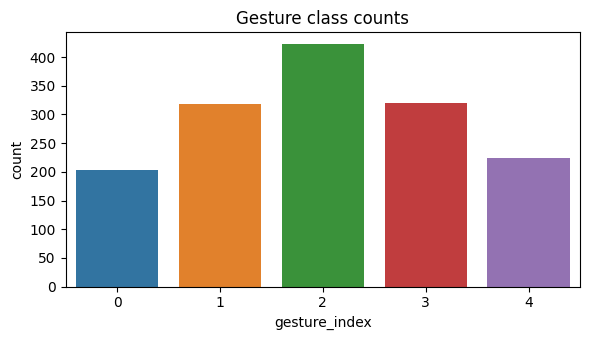

In [16]:
plt.figure(figsize=(6,3.5))
sns.countplot(x=y, palette='tab10')
plt.title('Gesture class counts')
plt.xlabel('gesture_index'); plt.ylabel('count')
plt.tight_layout(); plt.show()


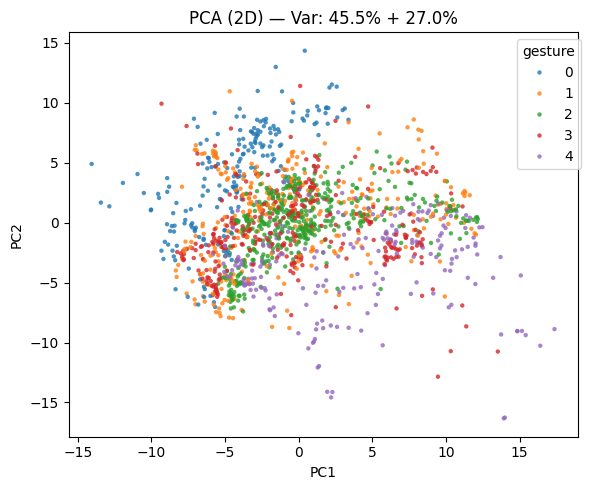

In [17]:
# 2D PCA
pca2 = PCA(n_components=2, random_state=42)
X_pca2 = pca2.fit_transform(X_scaled)
evr = pca2.explained_variance_ratio_

plt.figure(figsize=(6,5))
sns.scatterplot(x=X_pca2[:,0], y=X_pca2[:,1], hue=y, s=10, alpha=0.8, palette='tab10', linewidth=0)
plt.title(f'PCA (2D) — Var: {evr[0]*100:.1f}% + {evr[1]*100:.1f}%')
plt.xlabel('PC1'); plt.ylabel('PC2'); plt.legend(bbox_to_anchor=(1.02, 1), title='gesture')
plt.tight_layout(); plt.show()

# 3D PCA (interactive)
pca3 = PCA(n_components=3, random_state=42)
X_pca3 = pca3.fit_transform(X_scaled)
fig = px.scatter_3d(
    x=X_pca3[:,0], y=X_pca3[:,1], z=X_pca3[:,2],
    color=y.astype(str), opacity=0.7,
    title='PCA (3D)'
)
fig.update_traces(marker=dict(size=3))
fig.show()


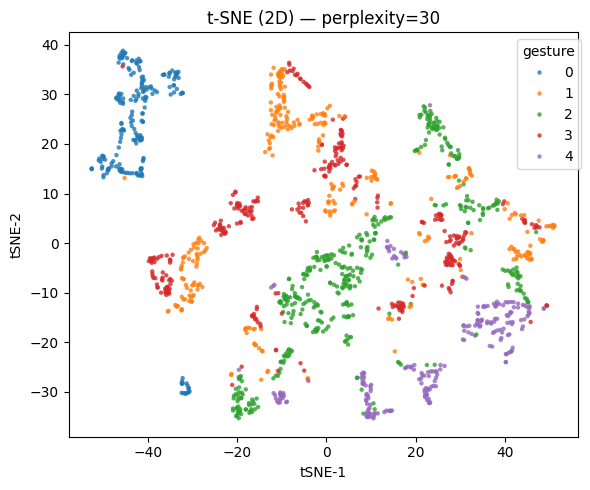

In [18]:
n = len(X_scaled)
# Safe perplexity (must be < n and typically 5–50)
perp = max(5, min(30, (n - 1) // 3))

tsne = TSNE(
    n_components=2, perplexity=perp, learning_rate='auto',
    init='pca', metric='euclidean', random_state=42, verbose=0
)
X_tsne = tsne.fit_transform(X_scaled)

plt.figure(figsize=(6,5))
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue=y, s=10, alpha=0.8, palette='tab10', linewidth=0)
plt.title(f't-SNE (2D) — perplexity={perp}')
plt.xlabel('tSNE-1'); plt.ylabel('tSNE-2'); plt.legend(bbox_to_anchor=(1.02, 1), title='gesture')
plt.tight_layout(); plt.show()


In [13]:
candidate_cols = [c for c in X.columns if c.startswith(('x1','y1','z1','x5','y5','z5','x17','y17','z17'))]
subset = df[candidate_cols + ['gesture_index']].copy()

# Downsample for readability
max_points = 3000
if len(subset) > max_points:
    subset = subset.sample(max_points, random_state=42)

sns.pairplot(subset, hue='gesture_index', plot_kws=dict(s=8, alpha=0.7), corner=True, palette='tab10')
plt.suptitle('Pairplot (selected joints)', y=1.02)
plt.show()


In [20]:
X = df.drop(["gesture_index"], axis = 1)
y = df["gesture_index"]

In [24]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.kernel_approximation import RBFSampler
from sklearn.pipeline import make_pipeline


# Median heuristic for gamma: gamma = 1 / (2 * median_pairwise_distance^2)
from sklearn.metrics.pairwise import pairwise_distances
md = np.median(pairwise_distances(X, X, metric="euclidean"))
gamma = 1.0 / (2.0 * (md**2) + 1e-12)

D = 4096 # try 2048, 4096, 8192
clf = make_pipeline(
    StandardScaler(with_mean=True, with_std=True),
    RBFSampler(gamma=gamma, n_components=D, random_state=0),
    LinearSVC(C=1.0, class_weight="balanced", dual=True)  # hinge loss, large-margin
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
scores = cross_val_score(clf, X, y, cv=cv, scoring="accuracy")
print("RFF+LinearSVC mean acc:", scores.mean(), "±", scores.std())


RFF+LinearSVC mean acc: 0.9596818294804871 ± 0.007329507116415414
